# Project 12 - Simulating Randomness

In [54]:
import random
import numpy as np
import pandas as pd

def run_monte_carlo(mean, sigma, num_sims, index):
    sim_dict = {}
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

    return sim_dict

mean = 0
sigma = 1
# number of simulations
num_sims = 2000
# number of periods per simulations
index = np.arange(2000)
monte_carlo_sim_dict = run_monte_carlo(mean, sigma, num_sims, index)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict)
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.786184,-1.583600,-0.157844,0.721344,0.284250,0.004658,0.402722,-0.152623,2.191356,-0.230177,...,-0.669708,1.548560,-0.833632,0.474994,0.013849,-0.002062,0.922595,1.055170,-1.923078,-0.278756
1,0.196391,-1.457615,0.040133,0.491584,-1.486575,-0.771182,-1.062751,0.545072,0.121772,-2.042408,...,0.893538,0.655465,-1.882892,-0.578430,-2.113801,-1.788173,0.187843,0.442400,-0.446319,0.134779
2,0.862487,-1.830181,1.309545,-1.644253,-0.334185,0.258823,0.402607,-0.646048,0.036875,0.352829,...,0.547541,0.515581,1.219829,1.055417,0.547937,1.656797,0.170278,-0.225707,-1.417121,-0.769158
3,0.590373,-0.172860,0.184681,-1.078901,-0.452961,1.555089,-0.480326,0.240530,0.688707,0.993939,...,0.309883,-0.923551,-0.920817,0.441230,-0.590806,-0.715560,-1.445995,-0.313755,-0.840522,0.224089
4,0.201210,-0.639086,1.446975,1.562403,-1.481782,-0.841872,0.637119,0.470659,1.068245,-1.196407,...,-0.614087,-0.047667,-0.768113,-0.985813,-0.150255,-0.283884,-0.593462,0.233620,0.959554,-1.871775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.861727,0.817796,-0.098947,-1.533666,0.290619,-0.558815,-0.978124,0.660096,0.192692,-0.399367,...,0.236196,-0.916159,-2.060533,-2.023781,-1.453101,0.827744,-1.458048,0.107224,0.532926,0.868812
1996,-1.019745,-0.420646,-1.822428,0.305806,0.058875,-1.693593,-0.170801,-0.677623,-1.737437,-1.781431,...,-1.785946,-0.387372,-0.064074,0.017606,-1.990940,-0.294426,0.275834,2.718606,-0.173150,-0.524865
1997,-0.909082,-1.472434,1.632484,-0.342453,-0.573117,0.845572,0.955729,-1.004440,0.367983,-0.408709,...,-0.927422,-0.325290,2.011849,-1.451555,0.624081,2.437429,0.004885,-0.716633,0.011701,0.300309
1998,-1.406771,-1.033252,-1.165911,1.582309,1.191509,1.675796,1.605740,-0.428444,0.304585,-0.978846,...,-0.663532,0.712112,-2.835965,-0.052283,0.130171,0.135915,1.282308,-0.206268,-0.963213,-0.314898


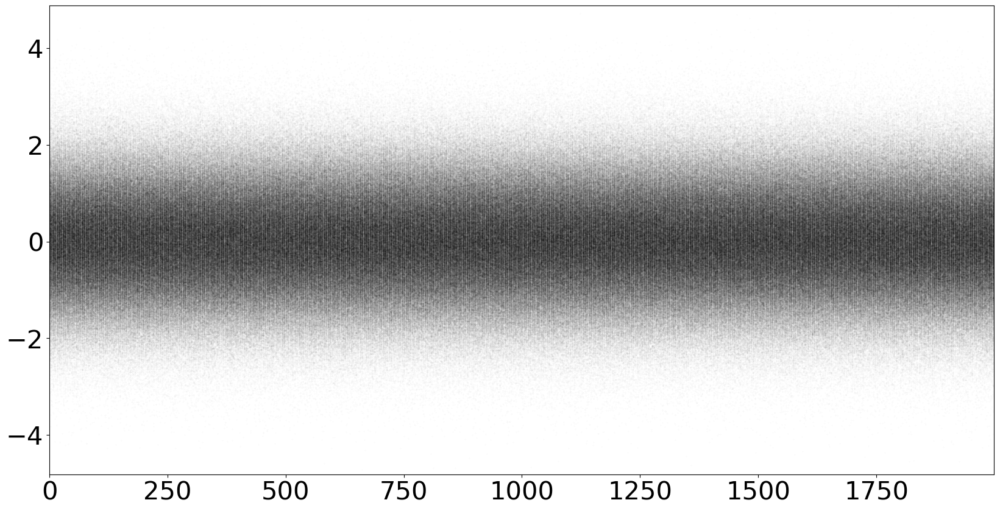

In [55]:
import matplotlib.pyplot as plt
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30
fig, ax = plt.subplots(figsize = (20,10))
monte_carlo_sim_df.plot.line(legend = False, ls = "", marker = ".", markersize = .05, color = "k", alpha = .5, ax = ax)
plt.show()

<Axes: >

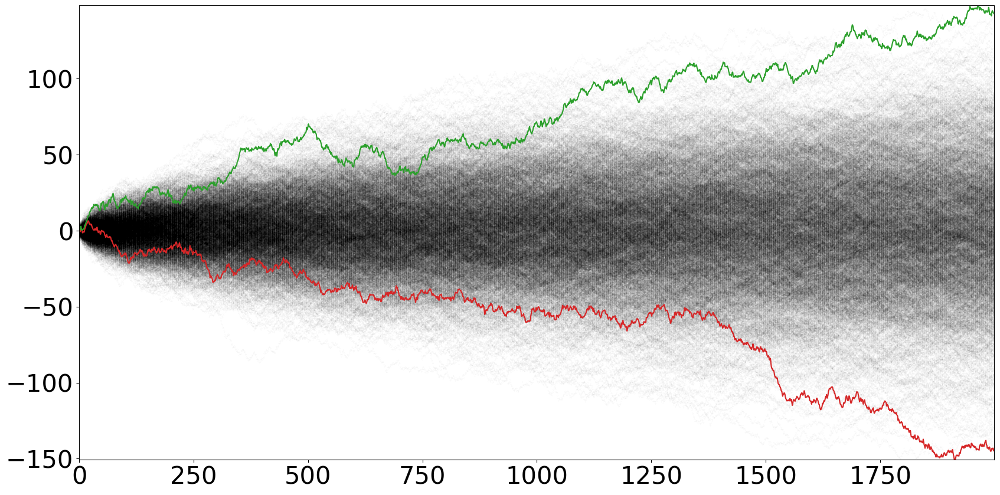

In [56]:
# find the min and max values in the very last period
plot_df = monte_carlo_sim_df.cumsum()
max = plot_df.iloc[-1].max()
min = plot_df.iloc[-1].min()
# find the column with the mas and max values
# index of last row refers to the key since key values start at 0
min_key = plot_df.iloc[-1][plot_df.iloc[-1] == min].index
max_key = plot_df.iloc[-1][plot_df.iloc[-1] == max].index


fig,ax = plt.subplots(figsize =(20,10))
plot_df.plot.line(legend = False, ls = "", marker = ".", markersize = 0.05,
                 color = "k", alpha = .5, ax = ax)
plot_df[min_key]. plot.line(legend = False, color = "C3", ax = ax)
plot_df[max_key].plot.line(legend = False, color = "C2", ax = ax)

In [57]:
mean = 0.05
sigma = 0.5
monte_carlo_sim_dict = run_monte_carlo(mean, sigma, num_sims, index)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df.tail()

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
1995,102.542090,141.353736,122.674286,89.565866,108.470243,97.143723,114.479426,144.104890,66.431015,69.002329,...,85.039999,103.818377,40.293690,134.987219,85.273699,102.082575,77.435730,107.744546,95.390477,121.643024
1996,102.788699,141.480648,122.512719,89.170911,107.036518,97.583889,114.797989,144.530995,66.769426,69.690920,...,84.211460,102.780994,40.349430,135.116526,84.977667,102.531720,76.923125,107.998454,95.308020,122.153887
1997,103.240970,141.952750,123.006692,89.645992,107.229098,96.936957,114.169452,144.488449,67.150067,69.521366,...,84.400142,102.873123,39.563388,135.085784,84.991791,102.425526,76.415421,107.633001,94.925296,122.347156
1998,102.801760,141.760325,124.281332,89.798226,106.961455,96.936517,114.573112,144.450065,67.613964,69.345905,...,84.331622,103.920388,39.546815,135.471733,85.042052,102.782980,76.706323,106.752018,95.093361,122.740700
1999,102.682785,142.139220,123.786011,90.180122,107.781041,97.223532,114.609237,144.738989,68.056993,69.715784,...,84.311086,104.454642,39.552996,135.221093,85.190409,102.849968,76.451852,107.046509,94.831982,122.486451


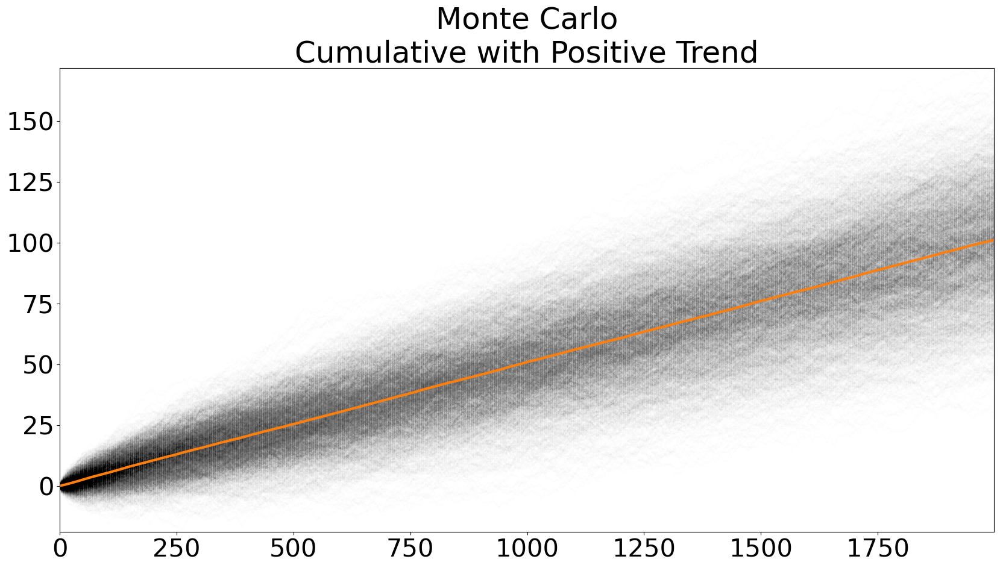

In [58]:
def plot_monte_carlo_sim(sim_data, title = None, logy = True, show_min = False, show_max = False):
    
    # calculate mean value by period
    sim_data["mean"] = sim_data.mean(axis = 1)
    fig, ax = plt.subplots(figsize = (20,10))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
    legend = False, ls = "", marker = ".", markersize = .2, 
    color = "k", alpha = 0.05, logy = logy, ax = ax)
    
    if show_max:
        max = sim_data.iloc[-1].max()
        max_key = sim_data.iloc[-1][sim_data.iloc[-1] == max].index
        sim_data.plot.line(y = max_key, legend = True, label = ["Best"], color = "C2", ax = ax)
    if show_min:
        min = sim_data.iloc[-1].min()
        min_key = sim_data.iloc[-1][sim_data.iloc[-1] == min].index
        sim_data[min_key].plot.line(y = min_key, legend = True, label = ["Worst"], color = "C3", ax = ax)
    
        
    sim_data["mean"].plot.line(color = "C1", linewidth = 3, 
                               logy = logy, ax = ax)
    ax.set_title(title)
    plt.show()
    plt.close()

plot_monte_carlo_sim(monte_carlo_sim_df,
                    title = "Monte Carlo\nCumulative with Positive Trend", logy = False)

In [59]:
import pandas_datareader.data as web
import datetime
import yfinance as yf
yf.pdr_override()

In [60]:
start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()
data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.get_data_yahoo(name, start, end)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [61]:
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)
close_data_df.tail()

,MSFT,AAPL,IBM,GOOG
Date,,,,
2024-04-26,406.320007,169.300003,167.130005,173.690002
2024-04-29,402.250000,173.500000,167.429993,167.899994
2024-04-30,389.329987,170.330002,166.199997,164.639999
2024-05-01,394.940002,169.300003,164.429993,165.570007
2024-05-02,397.839996,173.029999,164.690002,168.460007


In [62]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change.tail()

,MSFT,AAPL,IBM,GOOG
Date,,,,
2024-04-26,0.018244,-0.003473,-0.010538,0.099652
2024-04-29,-0.010017,0.024808,0.001795,-0.033335
2024-04-30,-0.032119,-0.018271,-0.007346,-0.019416
2024-05-01,0.014409,-0.006047,-0.010650,0.005649
2024-05-02,0.007343,0.022032,0.001581,0.017455


In [63]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace = True)
close_data_normalized.head()

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292


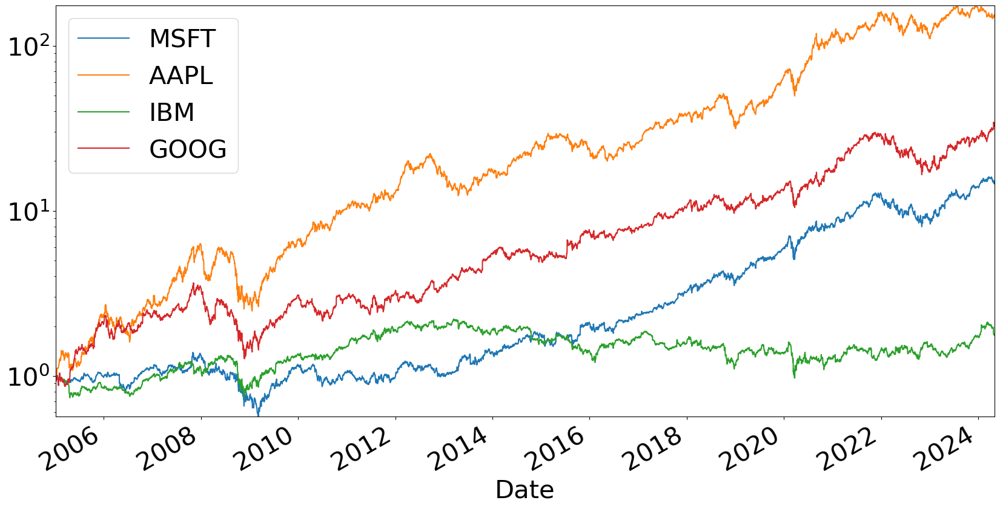

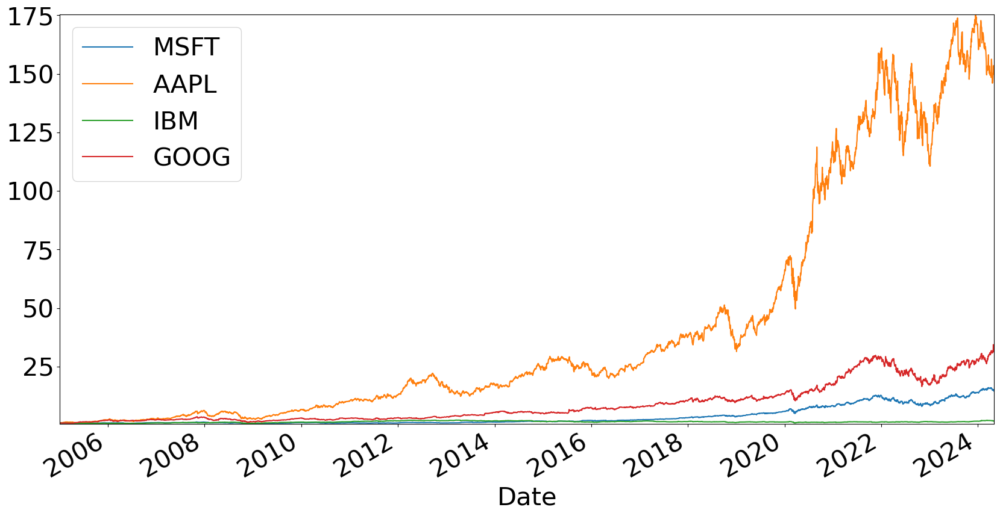

In [64]:
for log in (True, False):
    fig, ax = plt.subplots(figsize = (20,10))
    close_data_normalized.plot.line(ax = ax, logy = log)
    plt.show()
    plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [65]:
mean_var_df = pd.DataFrame(
    {"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
    1/close_data_normalized.shape[0]) -1,
     "sigma": close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000555,0.017239
AAPL,0.001034,0.020422
IBM,0.000116,0.014475
GOOG,0.000721,0.019001


In [66]:
num_sims = 500
dates = list(close_data_normalized.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]
    monte_carlo_sim_dict[stock] = run_monte_carlo(mean,
                                                 sigma,
                                                 num_sims,
                                                 dates)
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

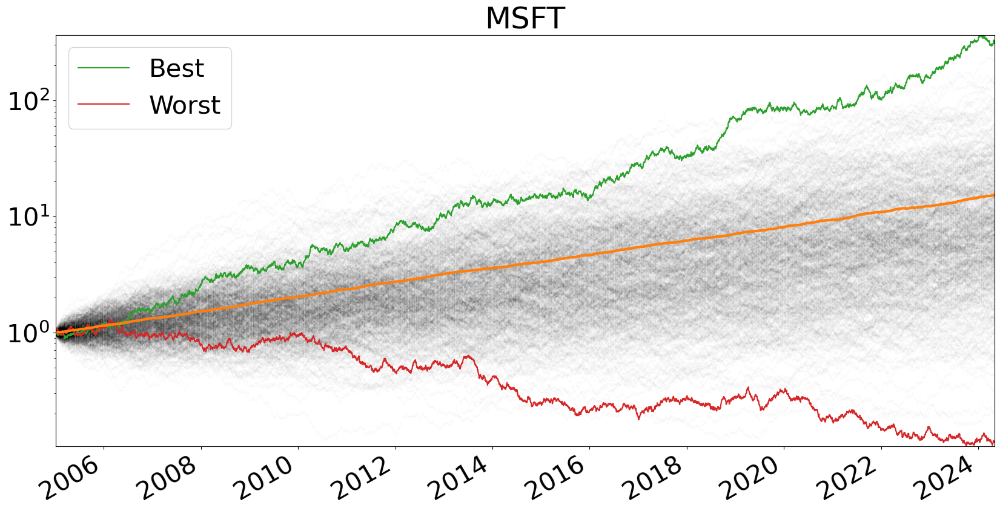

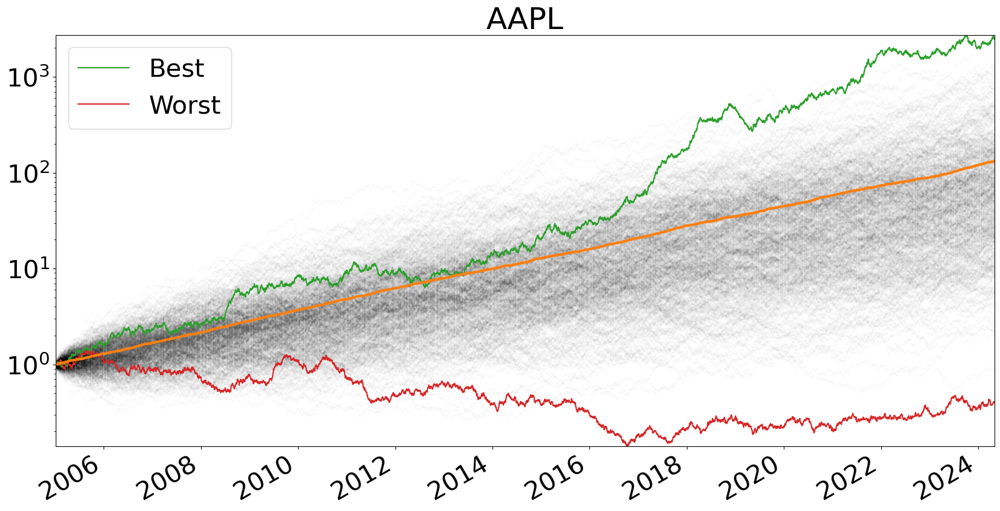

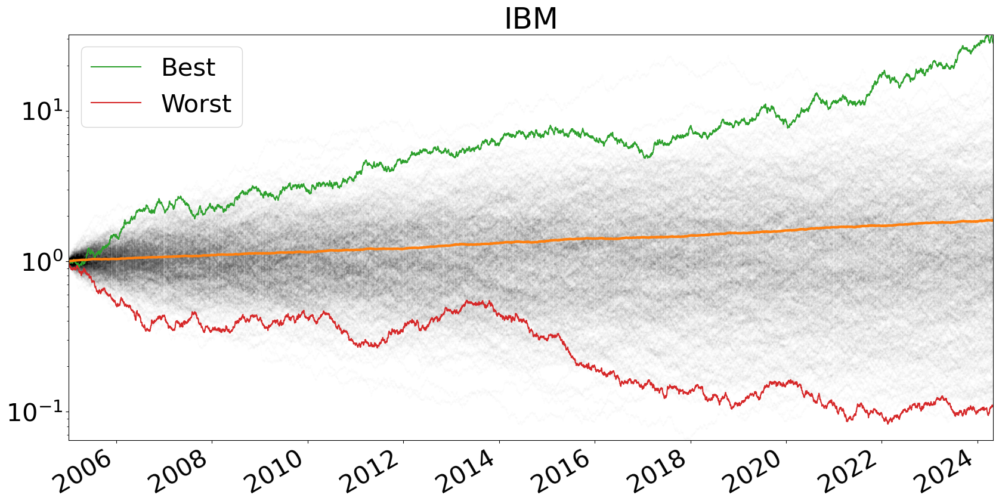

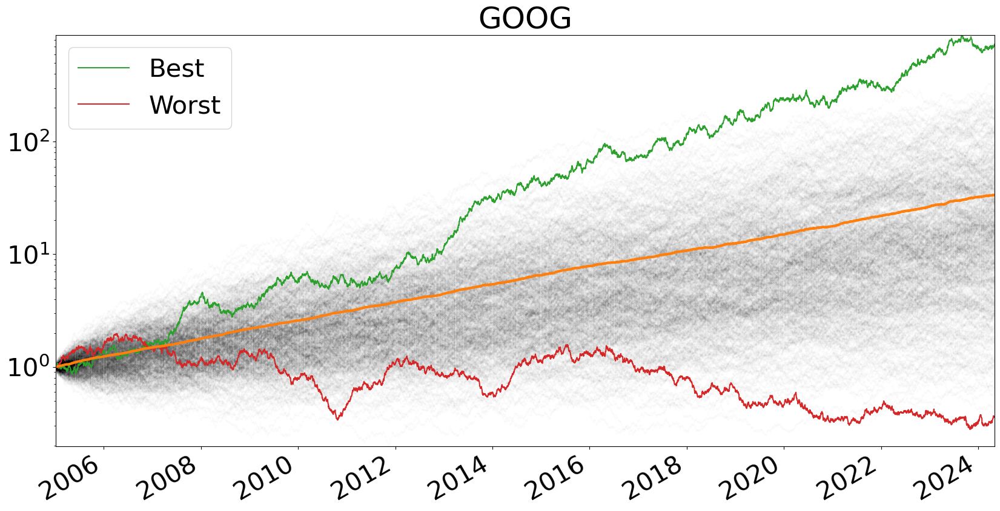

In [67]:
for stock, sim_data in monte_carlo_sim_dfs.items():
    plot_monte_carlo_sim(sim_data, title = stock, logy = True, show_min=True, show_max=True)

In [68]:
monte_carlo_sim_dfs[stock]

,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,mean
2005-01-03,0.995402,0.978221,0.989342,0.991448,0.992217,1.036490,1.007185,0.995195,1.007053,0.984966,...,1.024936,0.997844,1.001273,0.980148,1.014143,0.997203,0.975152,1.011215,1.032276,0.999924
2005-01-04,1.013568,1.004357,0.983182,1.019521,1.001275,1.021344,1.013719,1.005829,0.998357,0.983742,...,1.022106,0.985387,1.013591,0.973779,1.000450,0.981933,0.974616,1.018923,0.994236,0.999404
2005-01-05,0.997073,1.006867,0.985271,1.034655,1.017005,1.031291,1.021320,1.010653,1.009756,0.978184,...,1.033374,1.015576,1.026137,0.997650,1.003545,0.987450,0.971982,1.019101,0.973378,0.999347
2005-01-06,0.984382,1.003003,1.010999,1.053993,1.004688,1.056661,1.035109,1.024466,1.016446,0.997911,...,1.060693,0.966905,1.023306,0.978914,1.011871,1.014585,0.984659,1.033897,0.991165,1.000783
2005-01-07,0.986591,0.970143,1.008212,1.033820,0.987441,1.053488,1.036850,0.982727,1.027426,0.990269,...,1.052510,0.991677,1.029842,0.965085,1.012444,1.013869,0.982308,1.025476,0.990032,1.001592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26,10.378165,48.754240,199.263659,16.668894,19.017286,85.047977,2.450313,36.744068,4.788531,24.570070,...,96.408766,1.798440,12.927448,120.954967,18.462183,1.277413,138.407064,75.019485,10.492372,33.573597
2024-04-29,10.262919,49.081590,192.303600,16.732397,18.357202,84.900184,2.407774,36.849561,4.799533,24.568122,...,93.228158,1.834274,12.573857,118.484826,18.422554,1.259484,135.496479,73.349188,10.506719,33.560469
2024-04-30,10.081398,48.409078,195.576205,16.645714,18.087948,85.502245,2.378235,36.624281,4.921023,24.822715,...,93.096577,1.789364,12.546711,118.152485,18.680835,1.267045,135.439318,71.548904,10.346746,33.572858
2024-05-01,10.153718,48.206604,188.013550,16.456571,17.944904,85.784709,2.343619,36.310089,4.785287,25.245297,...,94.810090,1.763858,12.728606,115.673134,19.051310,1.268507,135.001992,72.386068,10.405097,33.571637


In [21]:
close_data_normalized.index is close_data_df.index

True

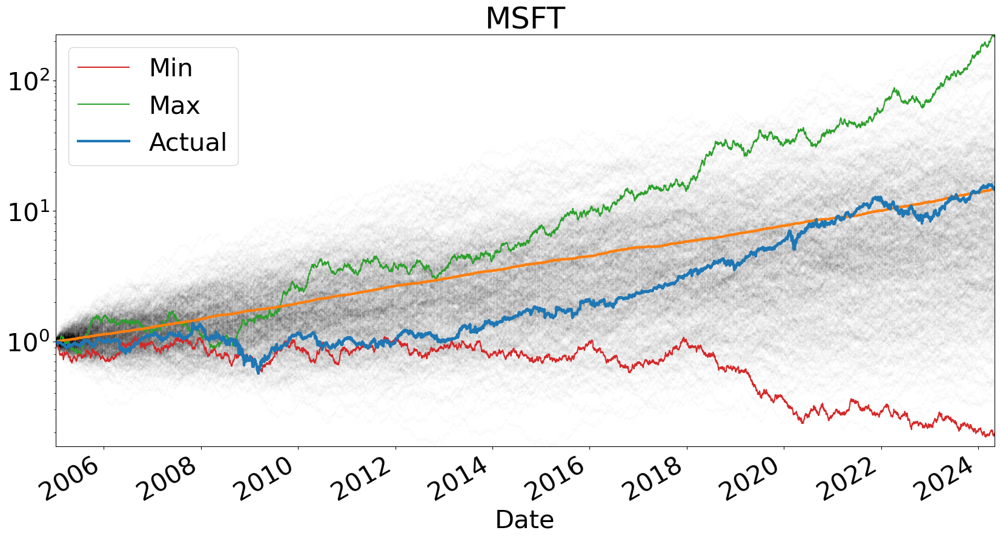

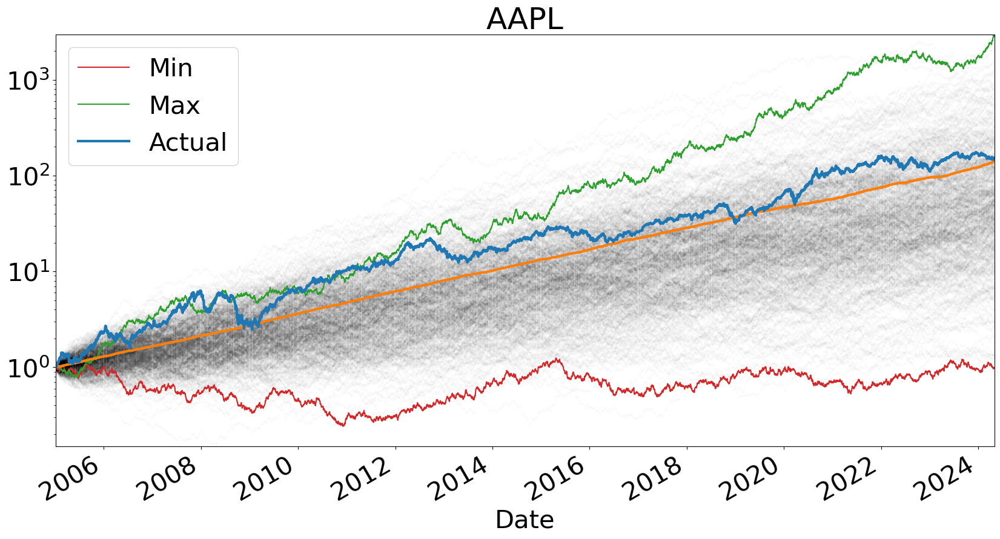

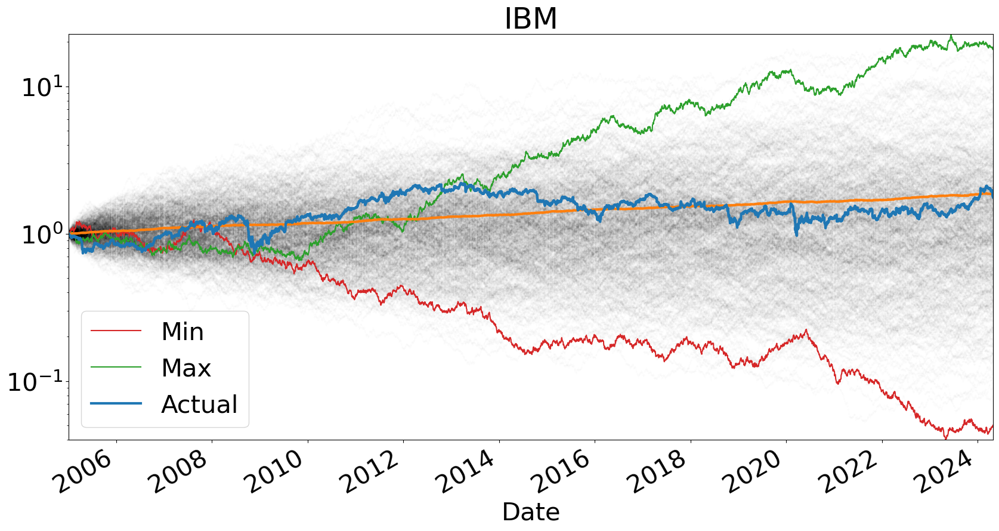

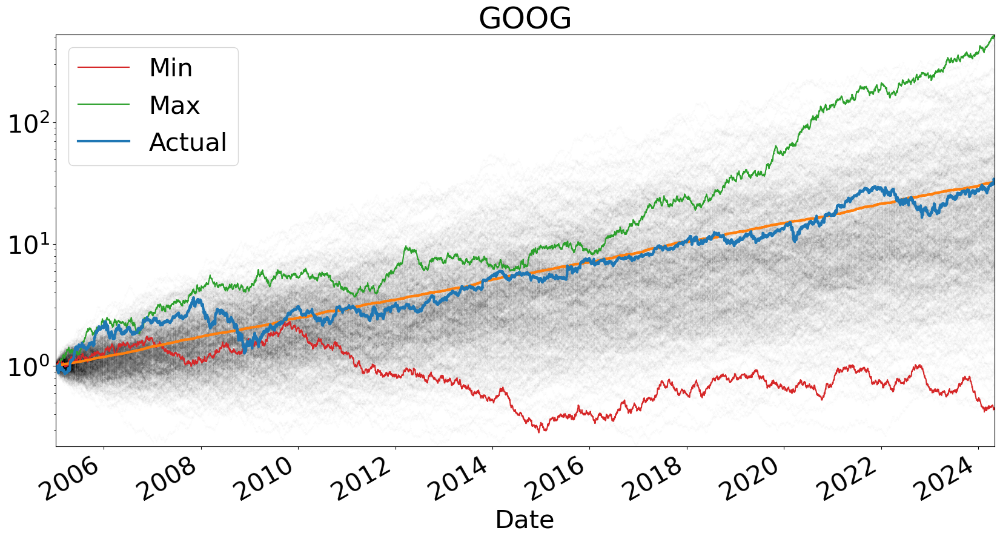

In [35]:
def plot_monte_carlo_sim(sim_data, close_data, stock = None, logy = True, show_min = False, show_max = False):
    
    # calculate mean value by period
    sim_data["mean"] = sim_data.mean(axis = 1)
    fig, ax = plt.subplots(figsize = (20,10))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
    legend = False, ls = "", marker = ".", markersize = .2, 
    color = "k", alpha = 0.05, logy = logy, ax = ax)
    
    for i, minmax in enumerate((show_min, show_max)):
        if minmax == True:
            minmax_str = ["min", "max"][i]
            minmax = getattr(sim_data.iloc[-1], minmax_str)()
            minmax_key = sim_data.iloc[-1][sim_data.iloc[-1] == minmax].index
            sim_data.plot.line(y = minmax_key, legend = True, label = [minmax_str.title()], color = f"C{3 - i}", ax = ax)
            
        
    sim_data["mean"].plot.line(color = "C1", linewidth = 3, 
                               logy = logy, ax = ax)
    close_data[stock].plot.line(color = "C0", linewidth = 3,
                               logy = logy, legend = True, label = "Actual", ax=ax)
    ax.set_title(stock)
    plt.show()
    plt.close()

for stock, sim_data in monte_carlo_sim_dfs.items():
    plot_monte_carlo_sim(sim_data, close_data_normalized, stock = stock, logy = True, show_min = True, show_max = True)

In [37]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [38]:
# .apply() sums the weighted value of each column for each row
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x: x.mul(portfolio_weights[x.name]),
                                                    axis = 0).sum(axis = 1),columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return.copy()
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2024-04-25,14.922962,150.321314,1.807467,31.284499,49.584060
2024-04-26,15.195214,149.799276,1.788419,34.402056,50.296241
2024-04-29,15.043007,153.515499,1.791629,33.255253,50.901347


Text(0.5, 1.0, 'Portfolio Return')

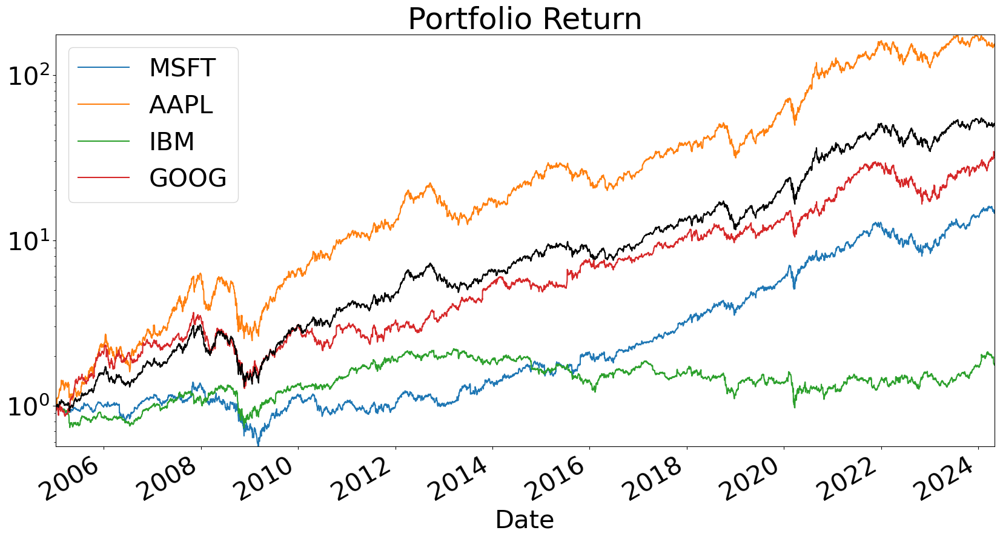

In [43]:
fig, ax = plt.subplots(figsize = (20,10))
close_data_normalized.drop("Portfolio Return", axis = 1).plot.line(legend = True, 
                                                         logy = True, ax = ax)
close_data_normalized[["Portfolio Return"]].plot.line(legend = False,
                                                     logy = True, 
                                                     color = "k",
                                                     ax = ax)
ax.set_title("Portfolio Return")

In [45]:
# build portfolio percent change since we constructed partfolio variable
## from cumulative products
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)

mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) ** (
    1 / ex_return.shape[0]) - 1,
                           "sigma": ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000804,0.016551


In [46]:
num_sims = 1000
dates = ex_return.index
# monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
monte_carlo_sim_dict["Portfolio Return"] = run_monte_carlo(mean,
                                                          sigma,
                                                          num_sims,
                                                          dates)

In [47]:
monte_carlo_sim_dfs["Portfolio Return"] = pd.DataFrame(monte_carlo_sim_dict["Portfolio Return"]).add(1).cumprod()
monte_carlo_sim_dfs

{'MSFT':                    0         1         2         3          4          5  \
 2005-01-03  0.974327  0.987518  1.002440  0.993453   0.984447   1.008285   
 2005-01-04  0.958423  1.010570  0.993808  1.018946   0.975856   1.025857   
 2005-01-05  0.964090  1.036180  1.000108  0.992738   0.986352   0.989357   
 2005-01-06  0.977773  1.027512  1.001175  0.981618   0.989583   0.999039   
 2005-01-07  0.976342  1.005065  1.020175  0.985494   1.006333   1.021393   
 ...              ...       ...       ...       ...        ...        ...   
 2024-04-25  2.966594  0.353872  4.041727  9.820884  67.472005  30.328305   
 2024-04-26  2.982874  0.363761  4.021918  9.578938  67.491337  29.964465   
 2024-04-29  2.993815  0.369136  3.989571  9.376262  66.019179  29.765212   
 2024-04-30  3.020236  0.358024  4.063131  9.536748  67.036103  29.971444   
 2024-05-01  3.049204  0.355493  4.085183  9.556603  67.413779  30.201464   
 
                     6         7         8          9  ...       4

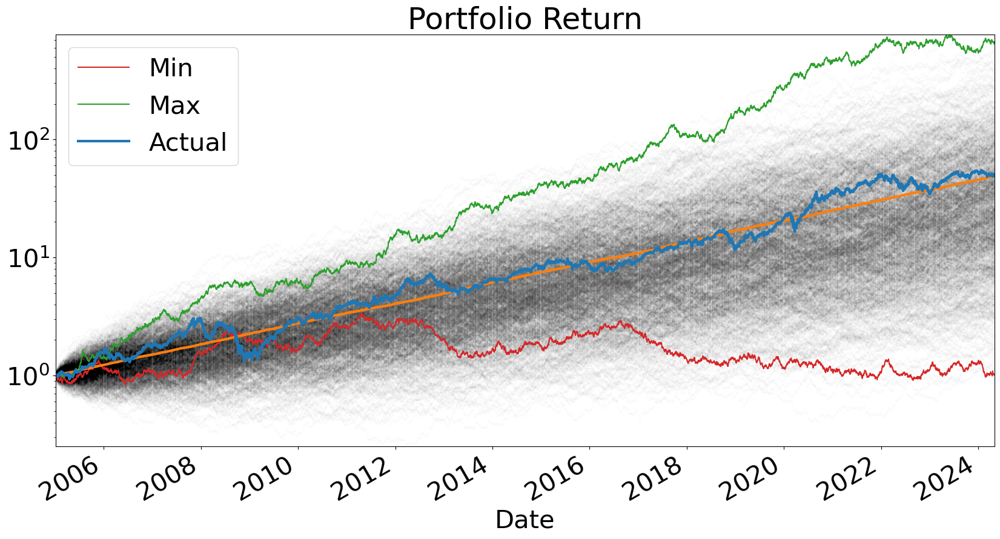

In [49]:
stock = "Portfolio Return"
sim_data = monte_carlo_sim_dfs[stock]
plot_monte_carlo_sim(sim_data,
                    close_data_normalized,
                    stock = stock,
                    logy = True,
                    show_min = True,
                    show_max = True)